In [1]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import os

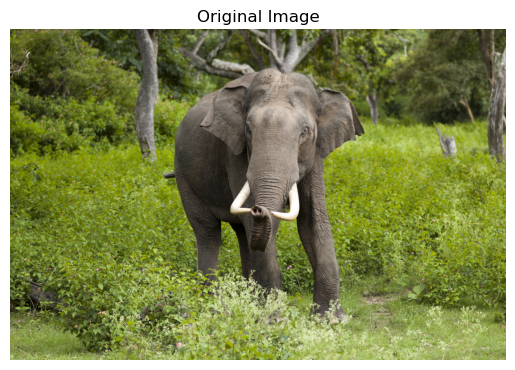

In [35]:
image_path = './Elephant.jpg'
original_image = cv2.imread(image_path)
original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(original_image_rgb)
plt.title("Original Image")
plt.axis('off')
plt.show()

In [29]:
def reduce_intensity_levels(image, num_levels):
    if not (num_levels & (num_levels - 1) == 0 and num_levels <= 256):
        raise ValueError("Number of levels must be a power of 2 (e.g., 2, 4, 8, ..., 256)")
    interval = 256 // num_levels
    return (image // interval) * interval


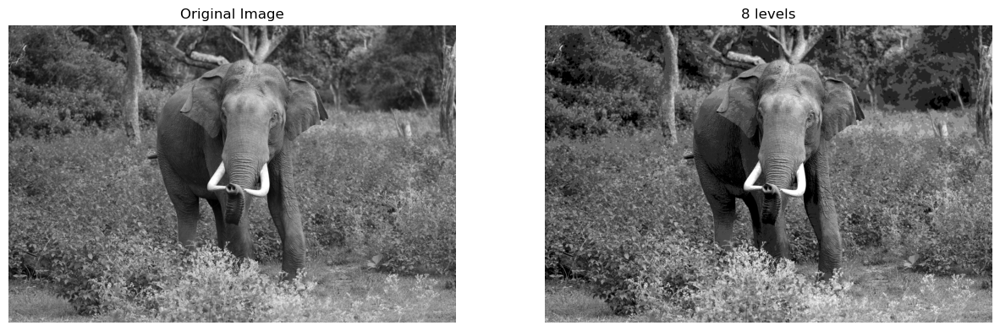

In [ ]:
gray_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
try:
    level_input = int(input("Enter desired number of intensity levels (e.g., 2, 4, 8, ...): "))
    reduced_image = reduce_intensity_levels(gray_image, level_input)

    # Show original and reduced image side by side
    plt.figure(figsize=(15, 12))
    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.imshow(gray_image, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title(f'{level_input} levels')
    plt.imshow(reduced_image, cmap='gray')
    plt.axis('off')

    plt.show()

except ValueError as ve:
    print("Invalid input:", ve)

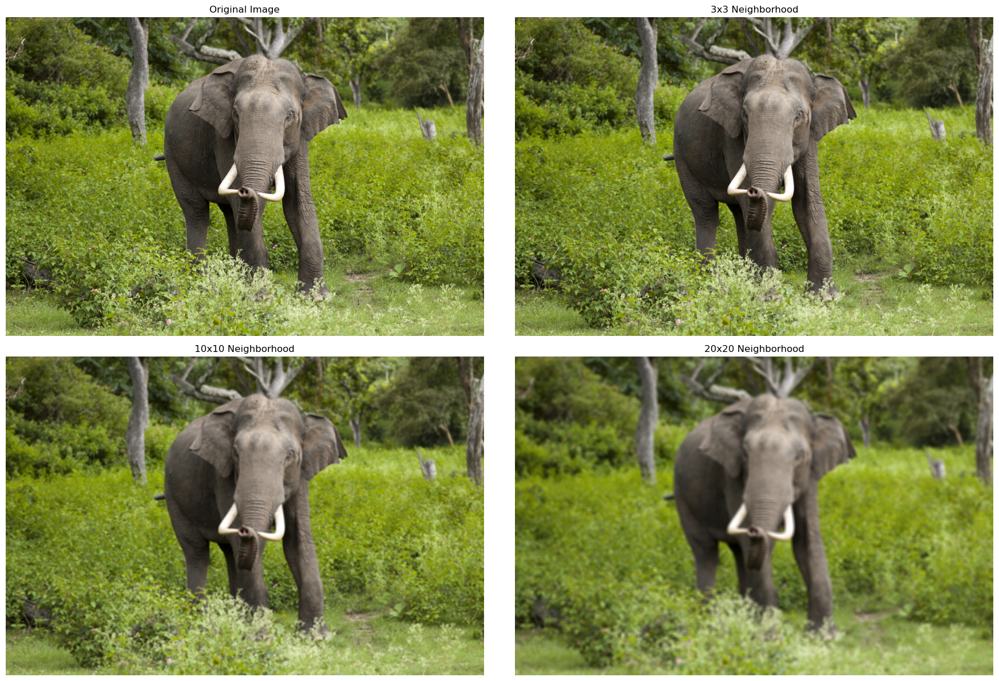

In [40]:
def spatial_average_filter(image, kernel_sizes):
    kernel = np.ones((kernel_sizes, kernel_sizes), np.float32) / (kernel_sizes * kernel_sizes)
    
    averaged = cv2.filter2D(image, -1, kernel)
    
    return averaged

kernel_sizes = [3, 10, 20]
plt.figure(figsize=(18, 12))

plt.subplot(2, 2, 1)
plt.title("Original Image")
plt.imshow(original_image_rgb)
plt.axis('off')

for i, size in enumerate(kernel_sizes):
    averaged = spatial_average_filter(original_image, size)
    averaged_rgb = cv2.cvtColor(averaged, cv2.COLOR_BGR2RGB)
    
    plt.subplot(2, 2, i+2)
    plt.title(f"{size}x{size} Neighborhood")
    plt.imshow(averaged_rgb)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [39]:
def rotate_image(image, angle):
    h, w = image.shape[:2]
    center = (w // 2, h // 2)
    rot_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)

    cos = np.abs(rot_matrix[0, 0])
    sin = np.abs(rot_matrix[0, 1])
    new_w = int((h * sin) + (w * cos))
    new_h = int((h * cos) + (w * sin))

    rot_matrix[0, 2] += (new_w / 2) - center[0]
    rot_matrix[1, 2] += (new_h / 2) - center[1]

    return cv2.warpAffine(image, rot_matrix, (new_w, new_h))

rotated_45 = rotate_image(original_image_rgb, 45)
rotated_90 = cv2.rotate(original_image_rgb, cv2.ROTATE_90_CLOCKWISE)

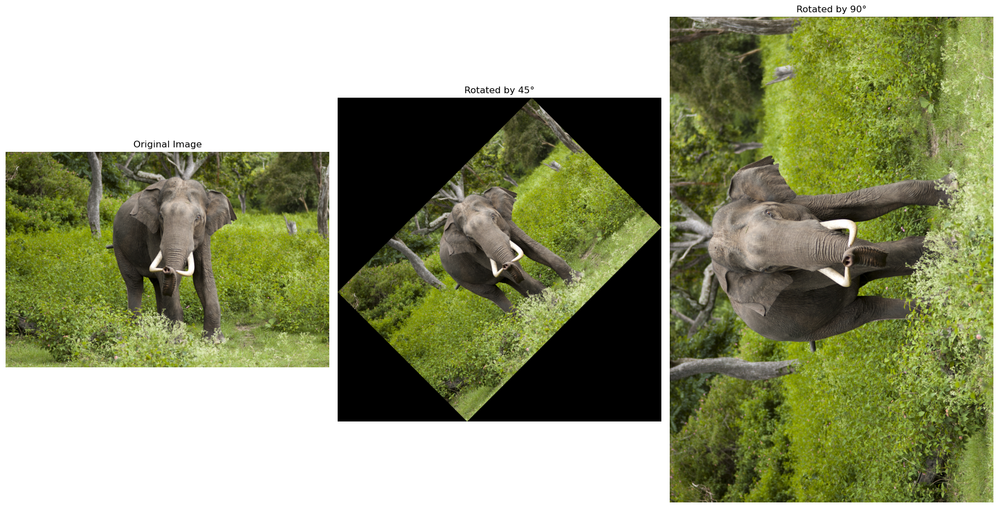

In [41]:
angles = [45, 90]

plt.figure(figsize=(18, 12))

plt.subplot(1, 3, 1)
plt.title("Original Image")
plt.imshow(original_image_rgb)
plt.axis('off')

for i, angle in enumerate(angles):
    rotated = rotate_image(original_image, angle)
    rotated_rgb = cv2.cvtColor(rotated, cv2.COLOR_BGR2RGB)
    
    plt.subplot(1, 3, i+2)
    plt.title(f"Rotated by {angle}°")
    plt.imshow(rotated_rgb)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [52]:
def block_average(image, block_size):
    h, w = image.shape[:2]
    h_trim = h - (h % block_size)
    w_trim = w - (w % block_size)
    img_crop = image[:h_trim, :w_trim]
    output = np.zeros_like(img_crop)

    for i in range(0, h_trim, block_size):
        for j in range(0, w_trim, block_size):
            block = img_crop[i:i+block_size, j:j+block_size]
            avg = np.mean(block, axis=(0, 1))
            output[i:i+block_size, j:j+block_size] = np.round(avg).astype(np.uint8)
    return output



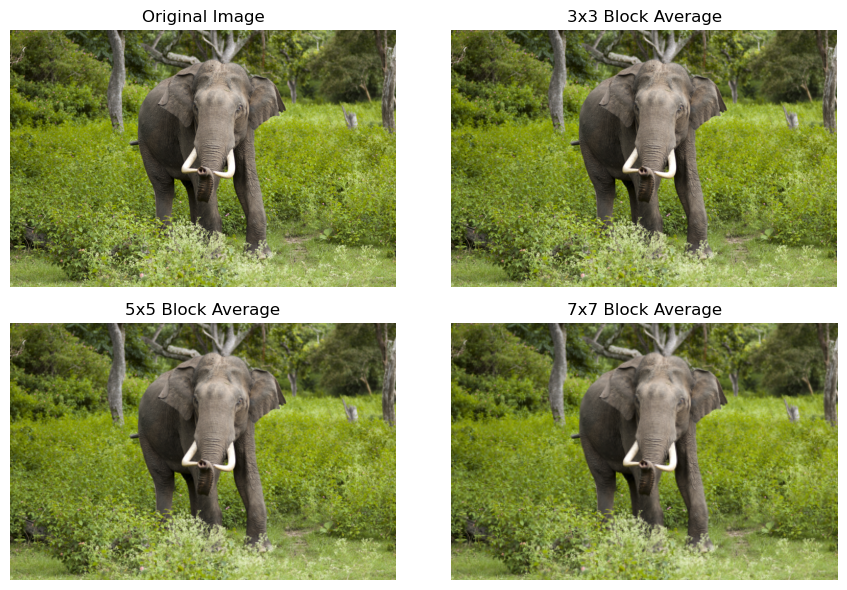

In [54]:
block_sizes = [3, 5, 7]
plt.figure(figsize=(9,6))
plt.subplot(2,2,1)
plt.title('Original Image')
plt.imshow(original_image_rgb)
plt.axis('off')

for i, block in enumerate (block_sizes):
        pixelated = block_average(original_image_rgb,block)
        plt.subplot(2, 2, i+2)
        plt.title(f"{block}x{block} Block Average")
        plt.imshow(pixelated)
        plt.axis('off')

plt.tight_layout()
plt.show()